In [1]:
import os
import copy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import healpy as hp
from rubin_sim.data import get_data_dir
import rubin_sim.maf as maf

In [2]:
# There may be things to calculate or plot from the new runs, but definitely need to compare new summaries to old

In [3]:
outDir = 'galplane_out'
# Where did I download the databases?
dataDir = '/Users/lynnej/opsim/v2.2/galplane'

In [4]:
runs = ['galplane_priority_blue_ag_1.5_v2.2_10yrs',
        'galplane_priority_red_ag_1.5_v2.2_10yrs', 
        'galplane_priority_blue_ag_2.0_v2.2_10yrs', 
        'galplane_priority_red_ag_2.0_v2.2_10yrs']

t = {}
for m in ['meta', 'sci', 'ddf']:
    t[m] = pd.read_csv(os.path.join(dataDir, f'summaries_{m}.csv'), index_col=0)
summary_new = t['meta']
for m in ['sci', 'ddf']:
    summary_new = summary_new.join(t[m], lsuffix='', rsuffix=f' {m}')
summary_new[0:10]

,fOArea fO All sky HealpixSlicer,fOArea/benchmark fO All sky HealpixSlicer,fONv MedianNvis fO All sky HealpixSlicer,fONv MinNvis fO All sky HealpixSlicer,fONv/benchmark MedianNvis fO All sky HealpixSlicer,fONv/benchmark MinNvis fO All sky HealpixSlicer,fOArea_750 fO All sky HealpixSlicer,Median Parallax Uncert (18k) Parallax Uncert @ 22.4 All sky HealpixSlicer,Area better than 11.5 mas uncertainty Parallax Uncert @ 22.4 All sky HealpixSlicer,95th Percentile Parallax Uncert Parallax Uncert @ 22.4 All sky HealpixSlicer,...,Median AGN_TimeLag_100_days DD:WFD g band HealpixSubsetSlicer,Rms AGN_TimeLag_100_days DD:WFD g band HealpixSubsetSlicer,Mean AGN_TimeLag_5_days DD:WFD g band HealpixSubsetSlicer,Median AGN_TimeLag_5_days DD:WFD g band HealpixSubsetSlicer,Rms AGN_TimeLag_5_days DD:WFD g band HealpixSubsetSlicer,Median Structure Function Uncert DD:WFD g band HealpixSubsetSlicer,Rms Structure Function Uncert DD:WFD g band HealpixSubsetSlicer,Median DD:WFD CoaddM5 g band HealpixSubsetSlicer,Median DD:WFD NVisits g band HealpixSubsetSlicer,Mean DD:WFD Median Inter-Night Gap g band UserPointsSlicer
run_name,,,,,,,,,,,,,,,,,,,,,
galplane_priority_blue_ag_1.5_v2.2_10yrs,10439.973653,0.579999,830.0,766.0,1.006061,0.928485,18202.600577,2.276751,27108.345447,10.344187,...,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,0.045597,0.002444,26.794036,69.0,17.929842
galplane_priority_red_ag_2.0_v2.2_10yrs,13661.182663,0.758955,844.0,743.0,1.023030,0.900606,17967.598357,2.309010,27110.863328,10.353928,...,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,0.037990,0.003805,26.858097,69.0,21.374883
galplane_priority_blue_ag_2.0_v2.2_10yrs,13217.196325,0.734289,842.0,744.0,1.020606,0.901818,17980.187761,2.268434,27041.201955,10.577462,...,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,0.038676,0.001970,26.839520,69.0,25.442029
galplane_priority_red_ag_1.5_v2.2_10yrs,10873.888467,0.604105,832.0,767.0,1.008485,0.929697,18201.761284,2.287944,27143.595780,10.273620,...,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,-1.637500e+30,0.038156,0.003038,26.833531,69.0,17.846826


In [8]:
summary_old = maf.get_metric_summaries(summary_source = 'summary_2022_08_01.csv')

metric_sets = maf.get_metric_sets('metric_sets.json')

summaries = pd.concat([summary_new, summary_old])

In [9]:
# Let's run a nvisits map over the whole sky, in all filters, for these 
filterlist, colors, orders, sqls, info_labels = maf.filterList(all=True)

calculate=False 

bundles = {}
nside = 64
slicer = maf.HealpixSlicer(nside=nside)
for r in runs:
    bundles[r] = {}    
    for f in filterlist:
        m = maf.CountMetric(col='observationStartMJD', metricName='Nvisits')
        constraint = sqls[f]
        bundles[r][f] = maf.MetricBundle(m, slicer, constraint, runName=r,
                                        info_label=info_labels[f])
    opsdb = os.path.join(dataDir, r + '.db')
    if calculate:
        g = maf.MetricBundleGroup(bundles[r], opsdb, outDir=outDir)
        g.runAll()
    else:
        for f in filterlist:
            filename = os.path.join(outDir, bundles[r][f].fileRoot + ".npz")
            bundles[r][f].read(filename)

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSID

In [36]:
# and also calculate for the bsaeline_v2.1 to have to hand (to compare background plane visits, eg.)
calculate=False 
baselineDir = '/Users/lynnej/opsim/v2.1/'

nside = 64
slicer = maf.HealpixSlicer(nside=nside)
for r in ['baseline_v2.1_10yrs']:
    bundles[r] = {}    
    for f in filterlist:
        m = maf.CountMetric(col='observationStartMJD', metricName='Nvisits')
        constraint = sqls[f]
        bundles[r][f] = maf.MetricBundle(m, slicer, constraint, runName=r,
                                        info_label=info_labels[f])
    opsdb = os.path.join(baselineDir, r + '.db')
    if calculate:
        g = maf.MetricBundleGroup(bundles[r], opsdb, outDir=outDir)
        g.runAll()
    else:
        for f in filterlist:
            filename = os.path.join(outDir, bundles[r][f].fileRoot + ".npz")
            bundles[r][f].read(filename)

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying table None with no constraint for columns ['rotSkyPos', 'fieldDec', 'fieldRA', 'observationStartMJD'].
Found 2081749 visits
Running:  ['all']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying table None with constraint filter = "g" for columns ['rotSkyPos', 'fieldDec', 'fieldRA', 'observationStartMJD']
Found 214824 visits
Running:  ['g']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying table None with constraint filter = "y" for columns ['rotSkyPos', 'fieldDec', 'fieldRA', 'observationStartMJD']
Found 390128 visits
Running:  ['y']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying table None with constraint filter = "z" for columns ['rotSkyPos', 'fieldDec', 'fieldRA', 'observationStartMJD']
Found 402511 visits
Running:  ['z']
Completed metric generation

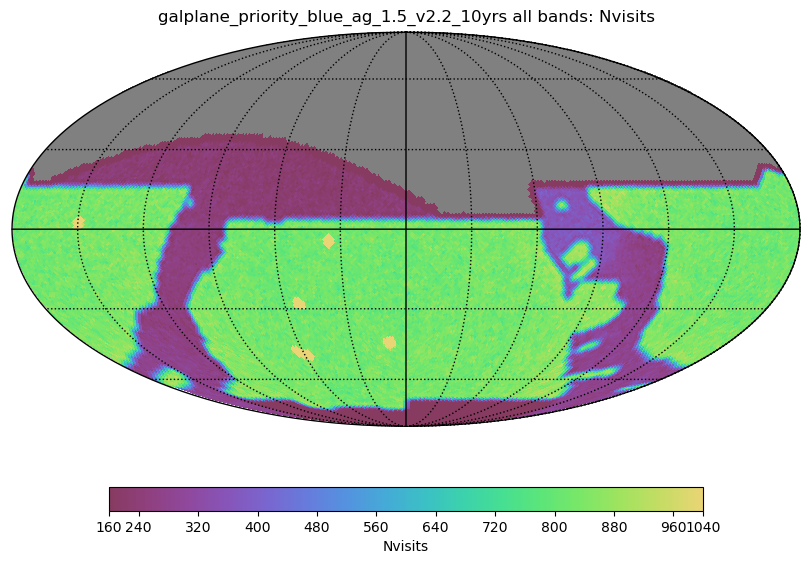

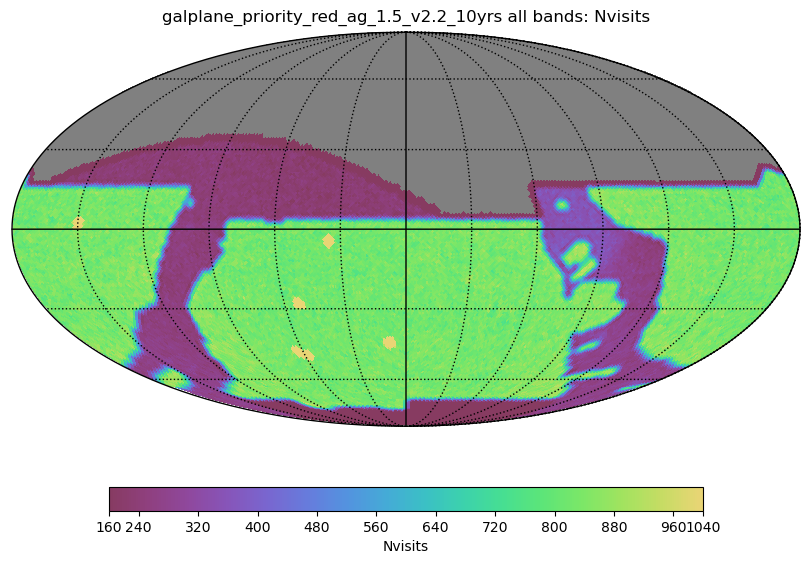

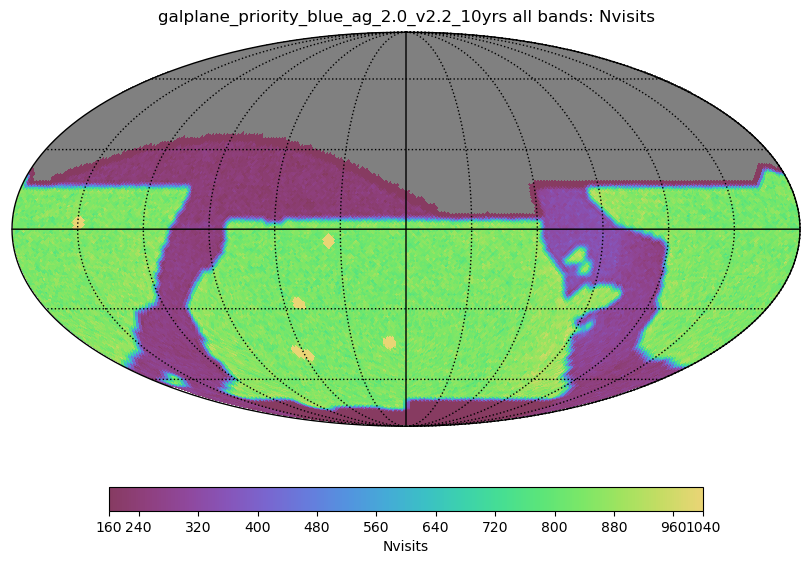

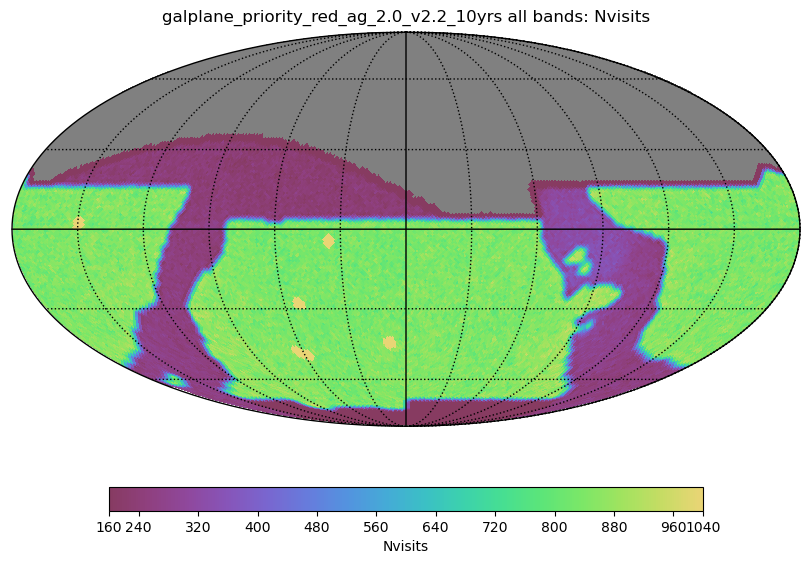

In [10]:
ph = maf.PlotHandler(thumbnail=False, outDir=outDir, figformat='png')
runs = ['baseline_v2.1_10yrs'] + runs
for r in runs:
    ph.setMetricBundles([bundles[r]['all']])
    plotdict = {'figsize': (8, 6), 'colorMin': 200, 'colorMax': 1000}
    ph.plot(maf.HealpixSkyMap(), plotDicts=plotdict)

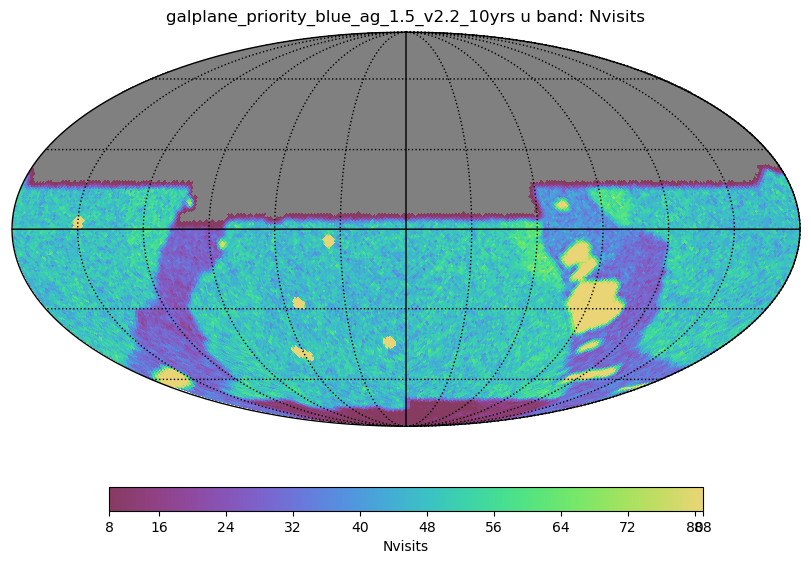

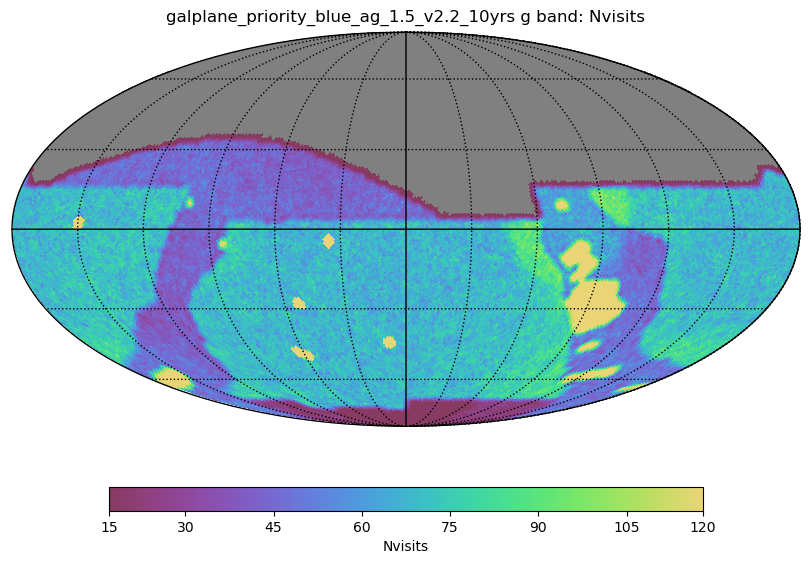

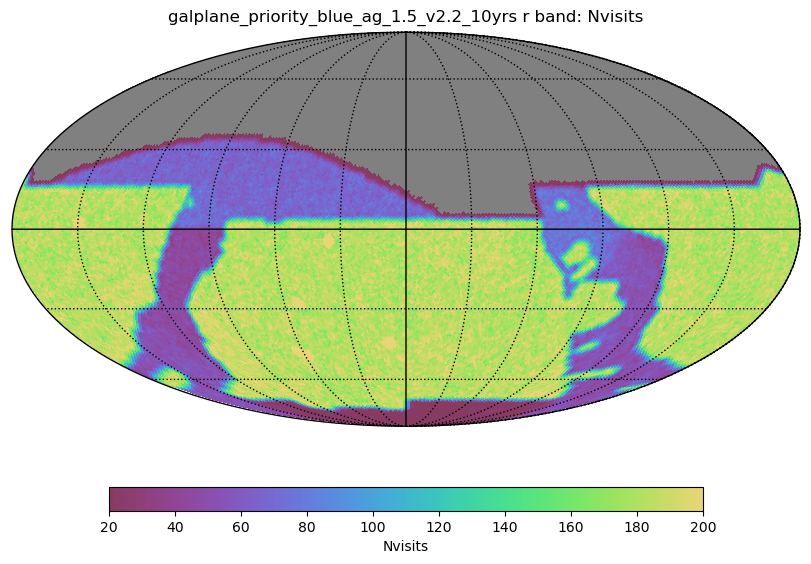

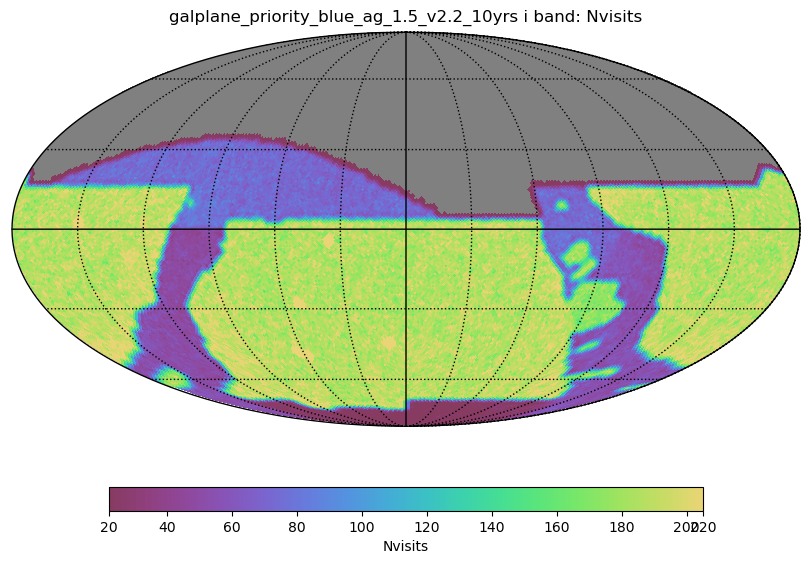

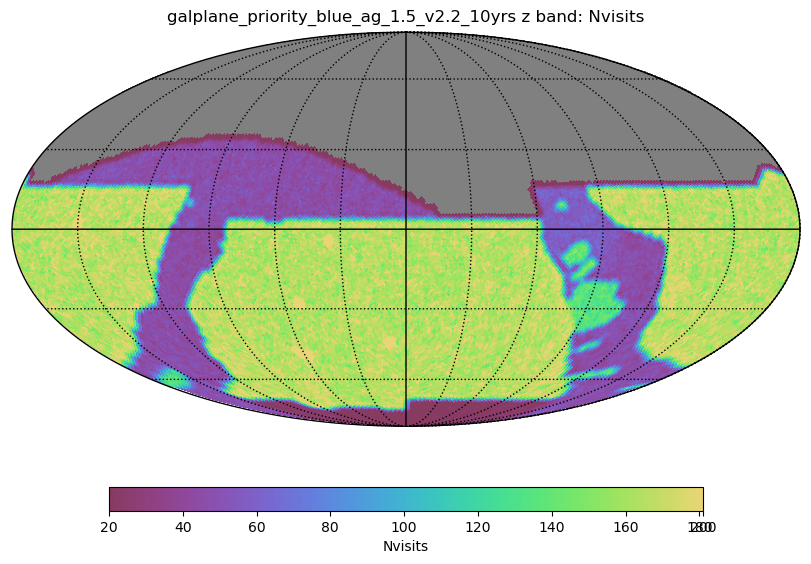

...

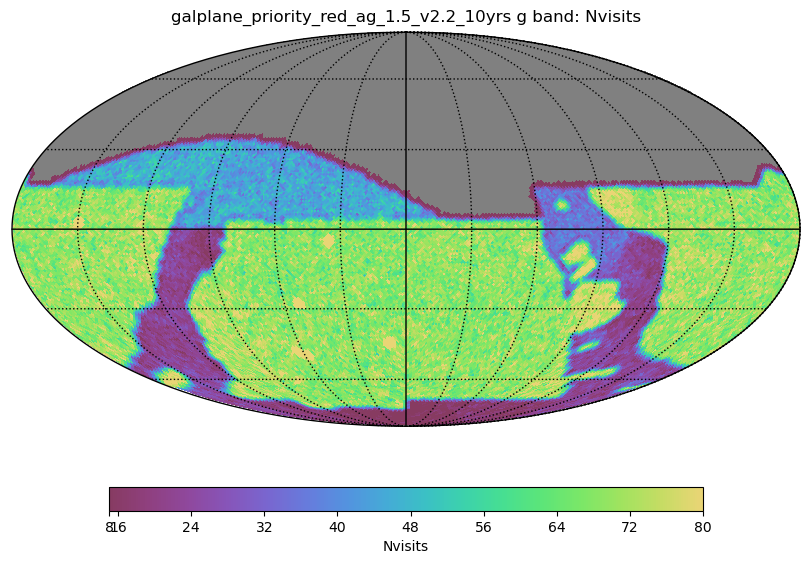

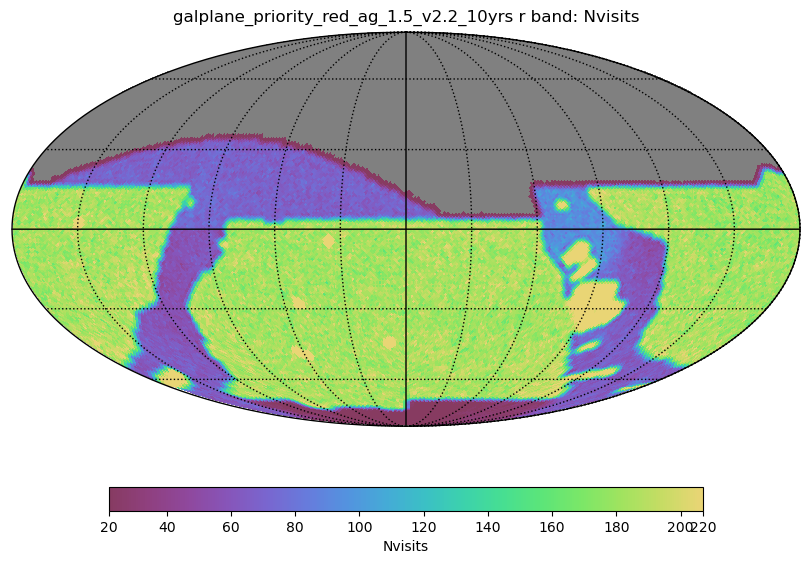

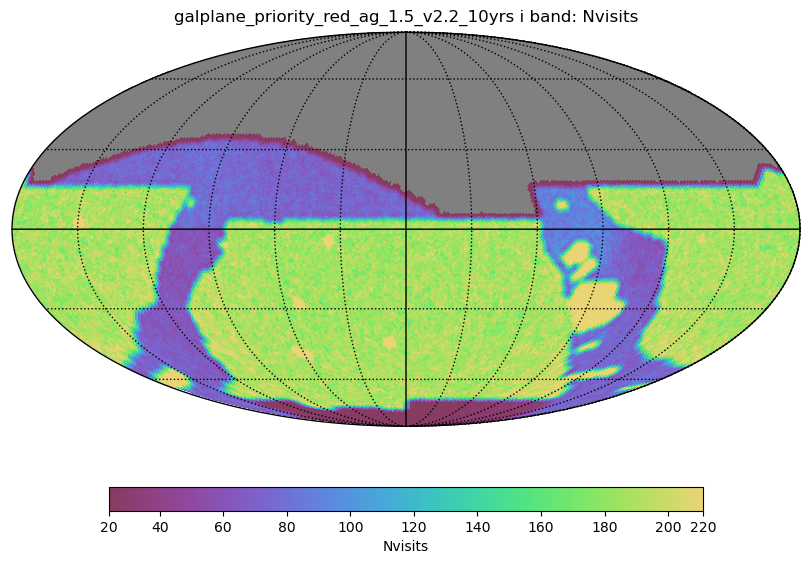

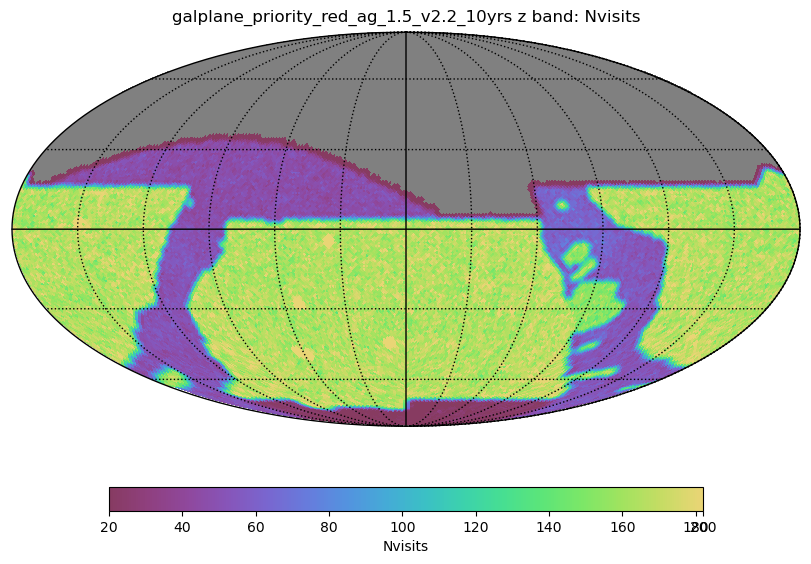

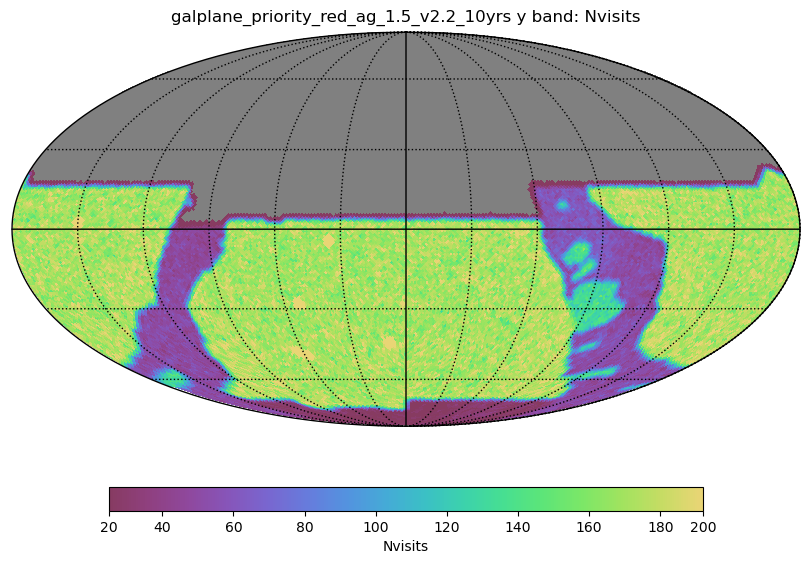

In [35]:
ph = maf.PlotHandler(thumbnail=False, outDir=outDir, figformat='png')
for r in [runs[1], runs[3]]:
    for f in 'ugrizy':
        ph.setMetricBundles([bundles[r][f]])
        plotdict = {'figsize': (8, 6), 'percentileClip': 95}
        ph.plot(maf.HealpixSkyMap(), plotDicts=plotdict)

In [11]:
# Grab the definition of the galactic plane region (that is excluding low-dust region)
import requests
url = "https://raw.githubusercontent.com/lsst-sims/sims_featureScheduler_runs2.2/main/galplane/galplane_footprint.py"
r = requests.get(url, allow_redirects=True)
with open('galplane_footprint.py', 'w') as f:
    f.write(r.content.decode())

In [12]:
from astropy.io import fits
from rubin_sim.scheduler.utils import Sky_area_generator
from galplane_footprint import Sky_area_generator_galplane

rootDir = "/Users/lynnej/other_repos/tvs_software_tools/GalPlaneSurvey/HighCadenceZone/"

blue_ratios = {}
blue_ratios['bulge'] = {"u": 0.56, "g": 0.83, "r": 0.95, "i": 0.9, "z": 0.71, "y": 0.56}
blue_ratios['plane'] = {"u": 0.19, "g": 0.24, "r": 0.24, "i": 0.24, "z": 0.24, "y": 0.19}

red_ratios = {}
red_ratios['bulge'] = {"u": 0.23, "g": 0.43, "r": 1.22, "i": 1.17, "z": 0.82, "y": 0.65}
red_ratios['plane'] = {'u': 0.08, 'g': 0.12, 'r': 0.31, 'i': 0.31, 'z': 0.28, 'y': 0.22}

nside=64
sky = Sky_area_generator_galplane(nside=nside, smc_radius=4, lmc_radius=6)
footprints_hp_array, labels_15 = sky.return_maps(
    1.5,
    root_dir=rootDir, 
    bulge_ratios=red_ratios['bulge'],
    dusty_plane_ratios=red_ratios['plane'])

sky = Sky_area_generator_galplane(nside=nside, smc_radius=4, lmc_radius=6)
footprints_hp_array, labels_20 = sky.return_maps(
    2.0,
    root_dir=rootDir, 
    bulge_ratios=red_ratios['bulge'],
    dusty_plane_ratios=red_ratios['plane'])

In [13]:
np.unique(labels_15)

array(['', 'LMC_SMC', 'bulge', 'dusty_plane', 'lowdust', 'nes', 'scp',
       'virgo'], dtype='<U20')

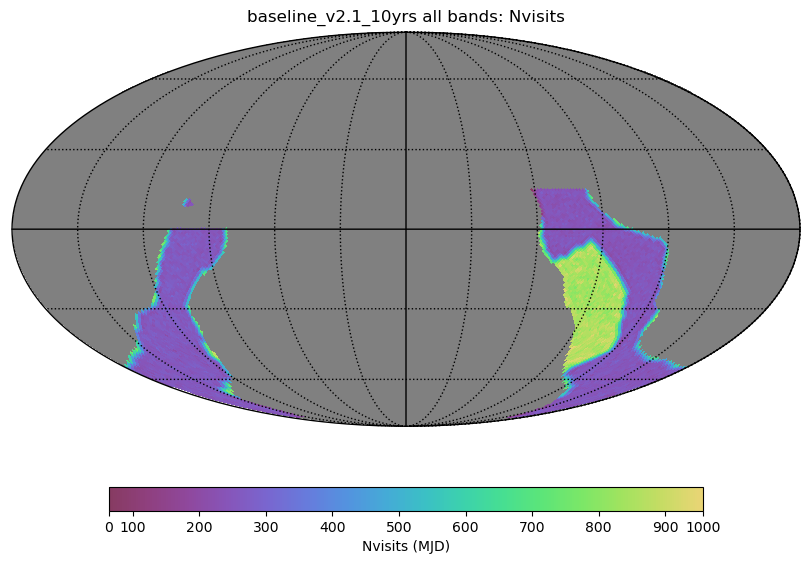

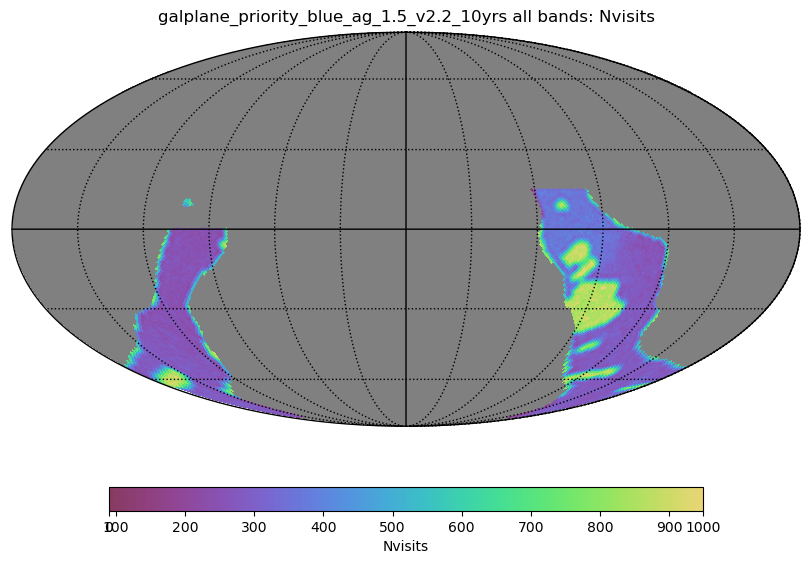

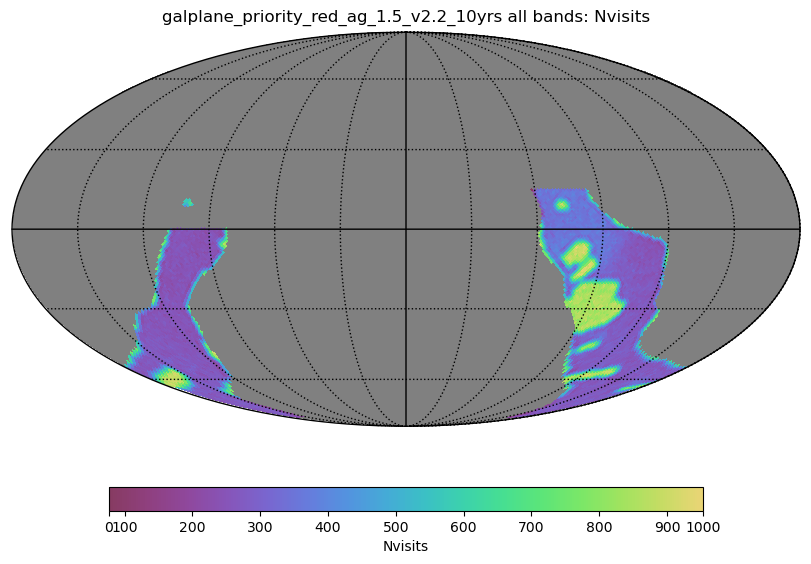

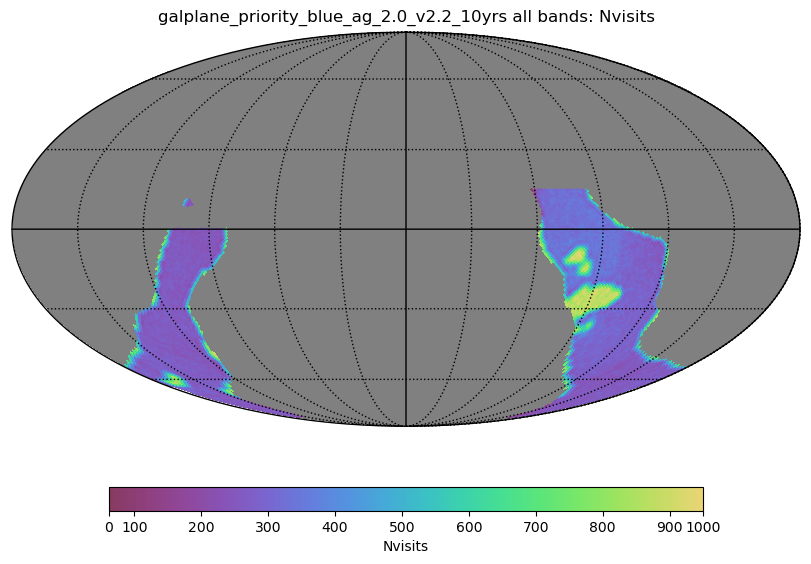

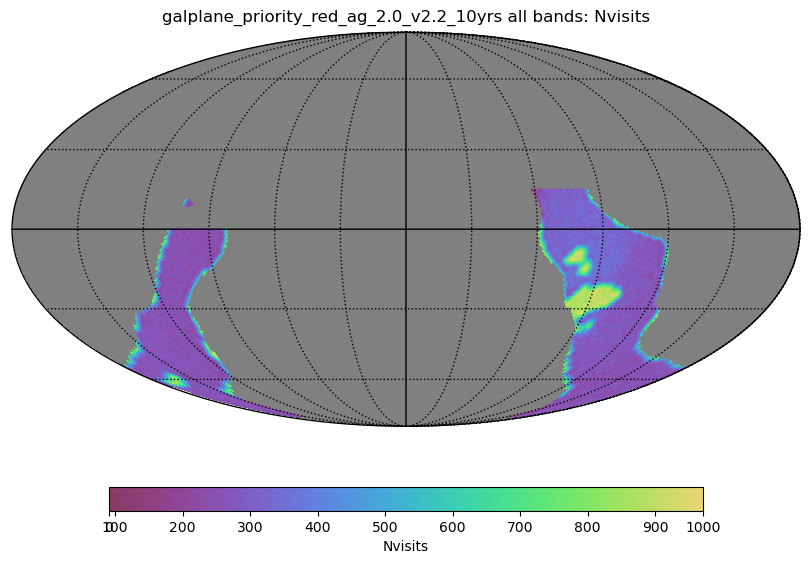

In [41]:
gp_pix = ((labels_15 == 'bulge')| (labels_15 =='dusty_plane'))
for r in runs:
    tmp = copy.deepcopy(bundles[r]['all'])
    tmp.metricValues.mask |= ~gp_pix
    ph.setMetricBundles([tmp])
    plotdict = {'figsize': (8, 6)} 
    ph.plot(maf.HealpixSkyMap(), plotDicts=plotdict)

In [57]:
nvis_plane = {}
runs = ['baseline_v2.1_10yrs'] + runs
for r in runs:
    if "1.5" in r:
        labels = labels_15
    else:
        labels = labels_20
    nvis_plane[r] = {}
    for f in filterlist:
        tmp = copy.deepcopy(bundles[r][f])
        tmp.metricValues.mask |= ~(labels == 'dusty_plane')
        tmp.setSummaryMetrics([maf.MeanMetric(), maf.MedianMetric()])
        tmp.computeSummaryStats()
        #nvis_plane[r][f"{f} Mean"] = tmp.summaryValues['Mean']
        nvis_plane[r][f"{f} Median"] = tmp.summaryValues['Median']

In [58]:
nvis_exwfd = {}
for r in runs:
    if "1.5" in r:
        labels = labels_15
    else:
        labels = labels_20
    nvis_exwfd[r] = {}
    for f in filterlist:
        tmp = copy.deepcopy(bundles[r][f])
        tmp.metricValues.mask |= ~(labels == 'lowdust')
        tmp.setSummaryMetrics([maf.MeanMetric(), maf.MedianMetric()])
        tmp.computeSummaryStats()
        #nvis_exwfd[r][f"{f} Mean"] = tmp.summaryValues['Mean']
        nvis_exwfd[r][f"{f} Median"] = tmp.summaryValues['Median']

In [59]:
nvis_high = {}
for r in runs:
    if "1.5" in r:
        labels = labels_15
    else:
        labels = labels_20
    nvis_high[r] = {}
    for f in filterlist:
        tmp = copy.deepcopy(bundles[r][f])
        tmp.metricValues.mask |= ~(labels == 'bulge')
        tmp.setSummaryMetrics([maf.MeanMetric(), maf.MedianMetric()])
        tmp.computeSummaryStats()
        #nvis_high[r][f"{f} Mean"] = tmp.summaryValues['Mean']
        nvis_high[r][f"{f} Median"] = tmp.summaryValues['Median']

In [61]:
nvis_plane = pd.DataFrame(nvis_plane).T
nvis_high = pd.DataFrame(nvis_high).T
nvis_exwfd = pd.DataFrame(nvis_exwfd).T
nvis_gp = nvis_plane.join(nvis_high, lsuffix=' GPwide', rsuffix=' GPHigh')
nvis_gp = nvis_gp.join(nvis_exwfd, rsuffix=' oWFD')
nvis_gp.T

,all Median,u Median,g Median,r Median,i Median,z Median,y Median
baseline_v2.1_10yrs GPwide,262.0,22.0,50.0,55.0,57.0,51.0,31.0
galplane_priority_blue_ag_1.5_v2.2_10yrs GPwide,289.0,31.0,49.0,56.0,57.0,50.0,50.0
galplane_priority_red_ag_1.5_v2.2_10yrs GPwide,281.0,12.0,25.0,67.0,73.0,56.0,54.0
galplane_priority_blue_ag_2.0_v2.2_10yrs GPwide,286.0,31.0,48.0,53.0,56.0,50.0,49.0
galplane_priority_red_ag_2.0_v2.2_10yrs GPwide,279.0,11.0,26.0,65.0,70.0,54.0,55.0
baseline_v2.1_10yrs GPHigh,842.5,32.0,186.0,197.0,195.0,180.0,48.0
galplane_priority_blue_ag_1.5_v2.2_10yrs GPHigh,831.0,90.0,151.0,173.0,166.0,127.0,107.0
galplane_priority_red_ag_1.5_v2.2_10yrs GPHigh,822.0,30.0,73.0,219.0,218.0,147.0,124.0
galplane_priority_blue_ag_2.0_v2.2_10yrs GPHigh,822.0,89.5,150.0,173.0,165.0,128.0,105.5
galplane_priority_red_ag_2.0_v2.2_10yrs GPHigh,828.5,30.0,75.0,224.0,218.5,148.0,124.0


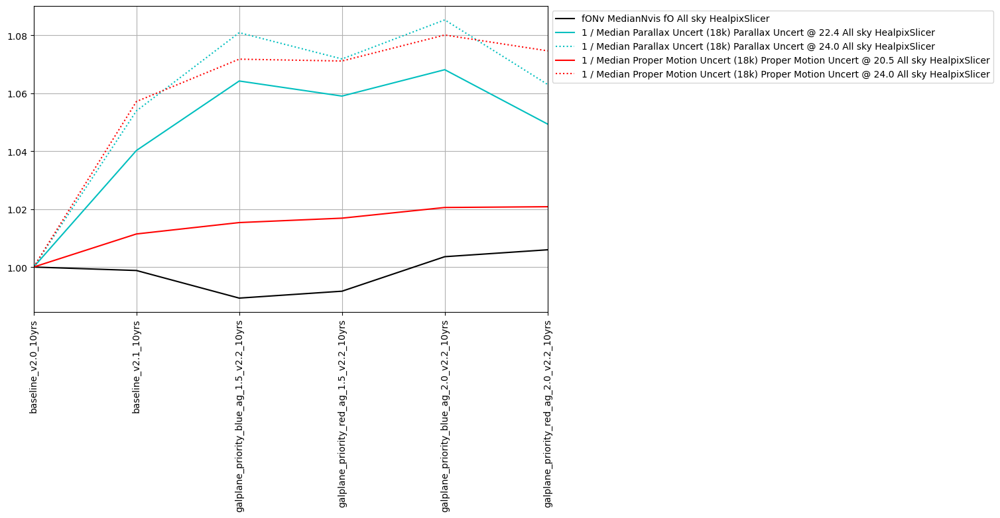

In [21]:
# Was there a significant impact between these runs on the SRD metrics? 
these_runs = ['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs'] + runs

msub = metric_sets.loc['SRD']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run='baseline_v2.0_10yrs',
                             metric_set=msub,
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=.1)

In [26]:
# Let's check out other metrics 

msets = list(metric_sets.groupby('metric set').first().index)
msets = [m for m in msets if 'DDF' not in m]

for k in msets:
    print(k, len(metric_sets.loc[k]))
    # Check that the metrics are correctly named and in the summary file
    summaries.loc[:, metric_sets.loc[k]['metric']]

AGN N QSO 6
AGN SF 12
AGN short 5
AGN timelag 12
DESC WFD 10
GP filters 12
GP footprint 6
GP season 6
GP visit 6
N Visits 9
SCOC 22
SL TDC 6
SRD 5
SSO N Objs 6
SSO discovery 14
SSO discovery options 22
SSO fraction 3 bands 14
SSO fraction 4 bands 14
SSO fraction 5 bands 14
SSO fraction 6 bands 14
SSO lightcurve inversion 8
Stars 9
TVS KNe 7
TVS KNe short 3
TVS PeriodModulation 8
TVS PeriodicDetect 6
TVS Presto 2
TVS TDE 5
TVS Tgaps 12
TVS XRB 3
TVS anomalies 5
TVS microlensing all 17
TVS microlensing short 4
TVS short 6
WFD Depths 18
cadence 8
galaxies 8
plot areas 5
radar 11
short description 10


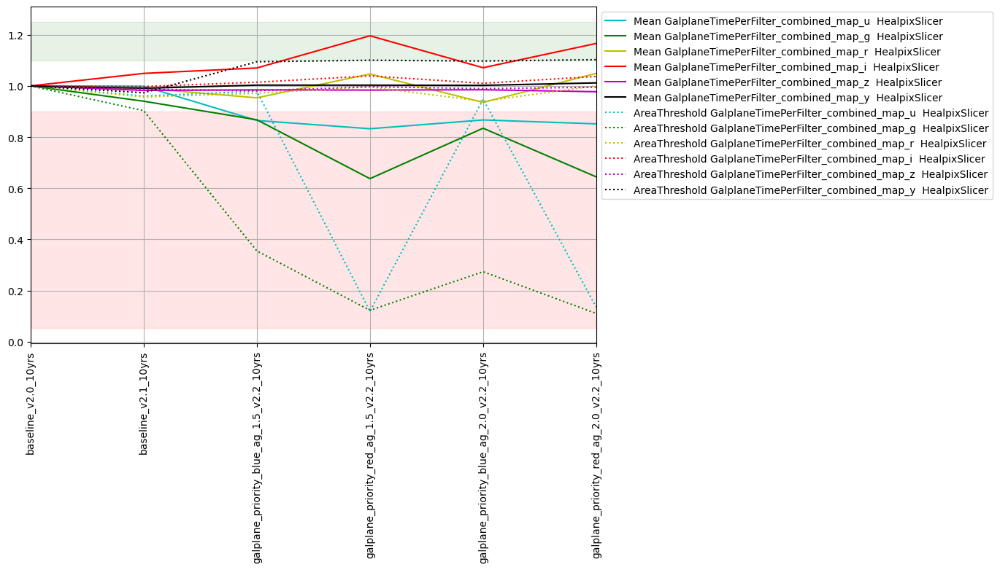

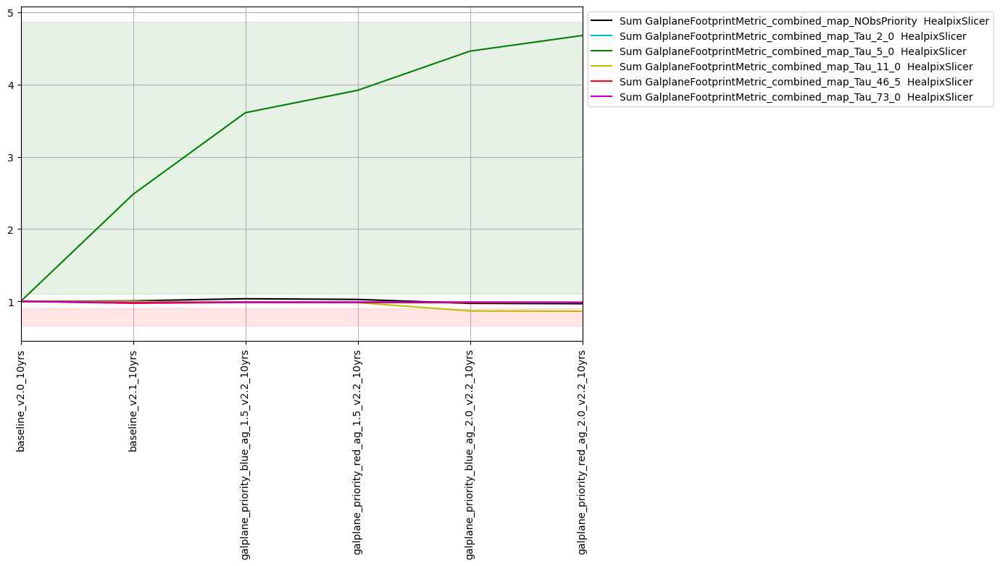

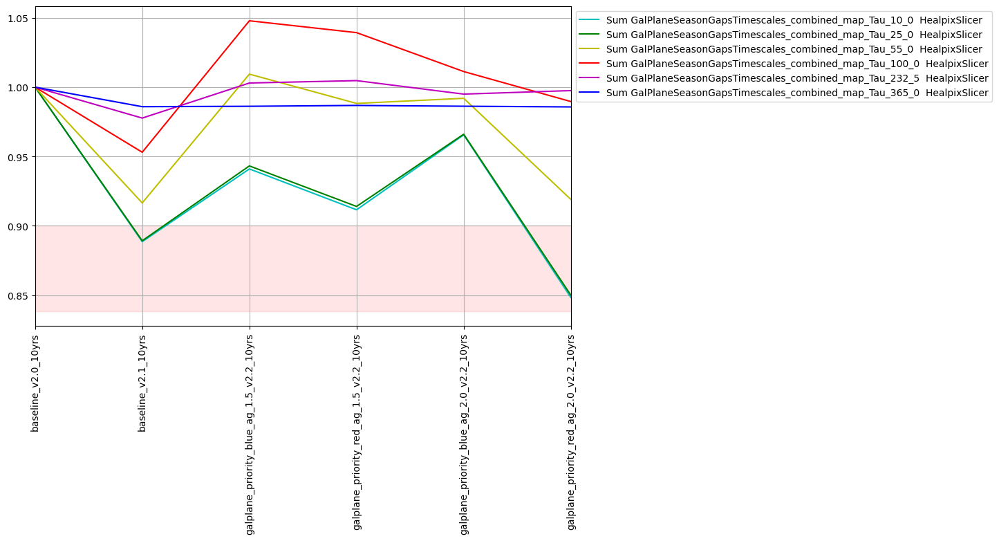

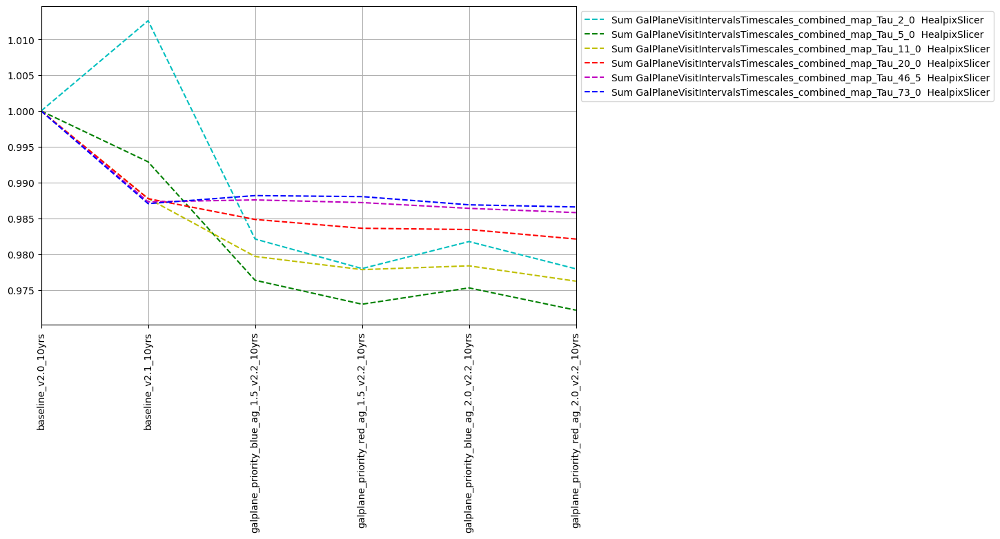

In [27]:
kk = [k for k in msets if k.startswith('GP')]

for k in kk:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                                 baseline_run='baseline_v2.0_10yrs',
                                 metric_set=msub,
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=.1)

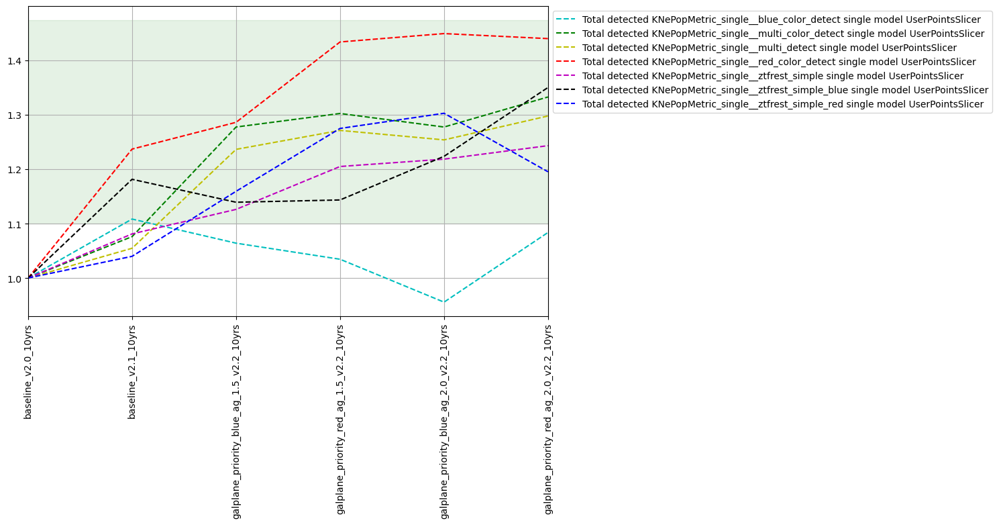

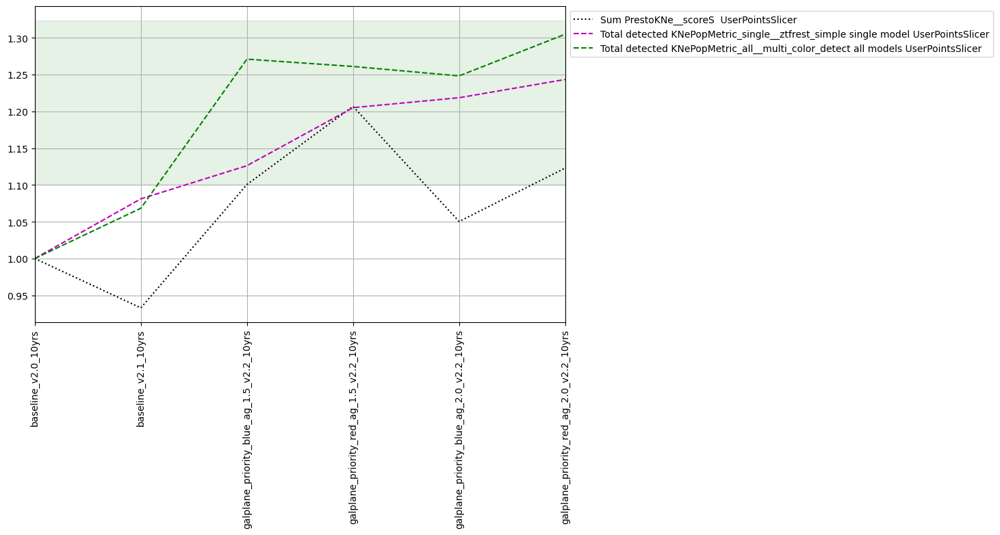

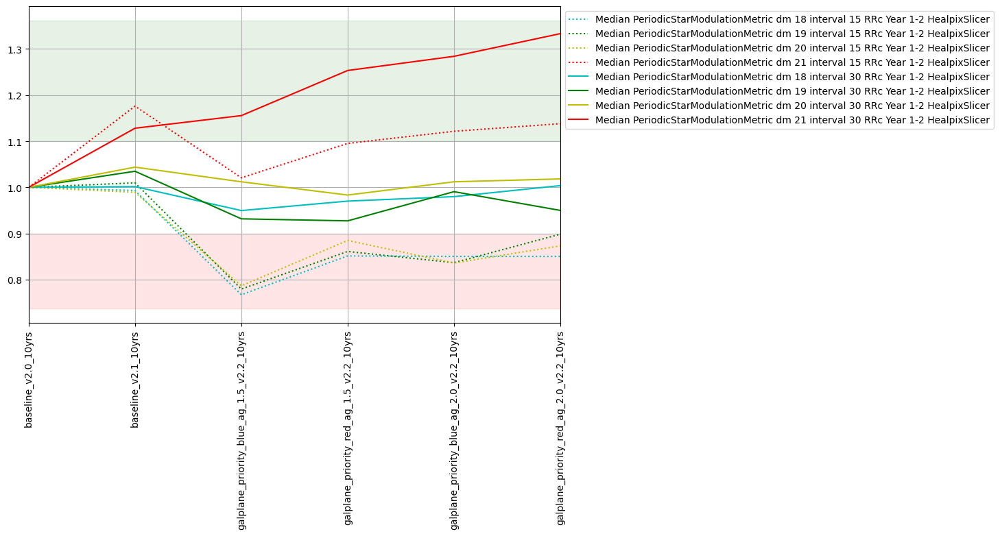

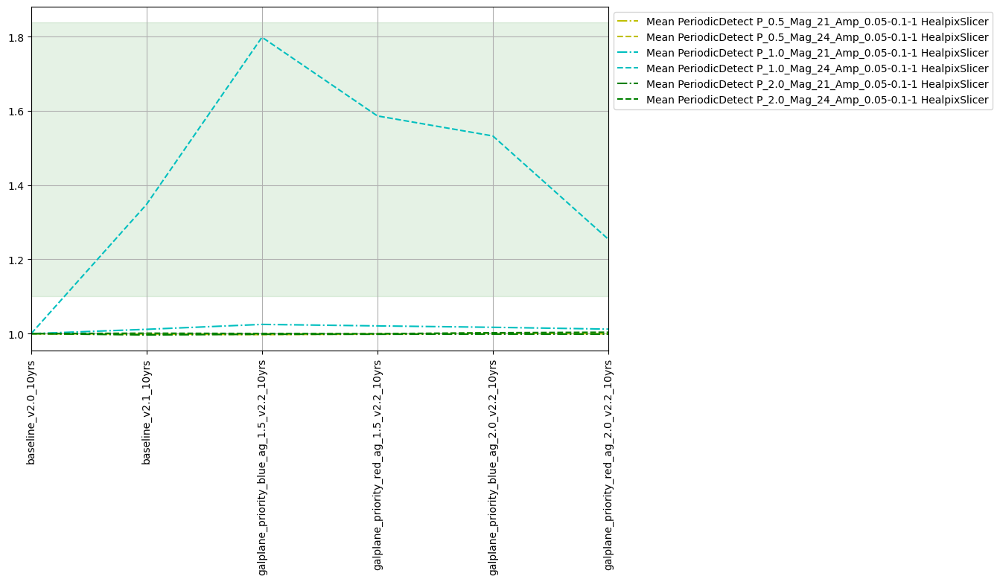

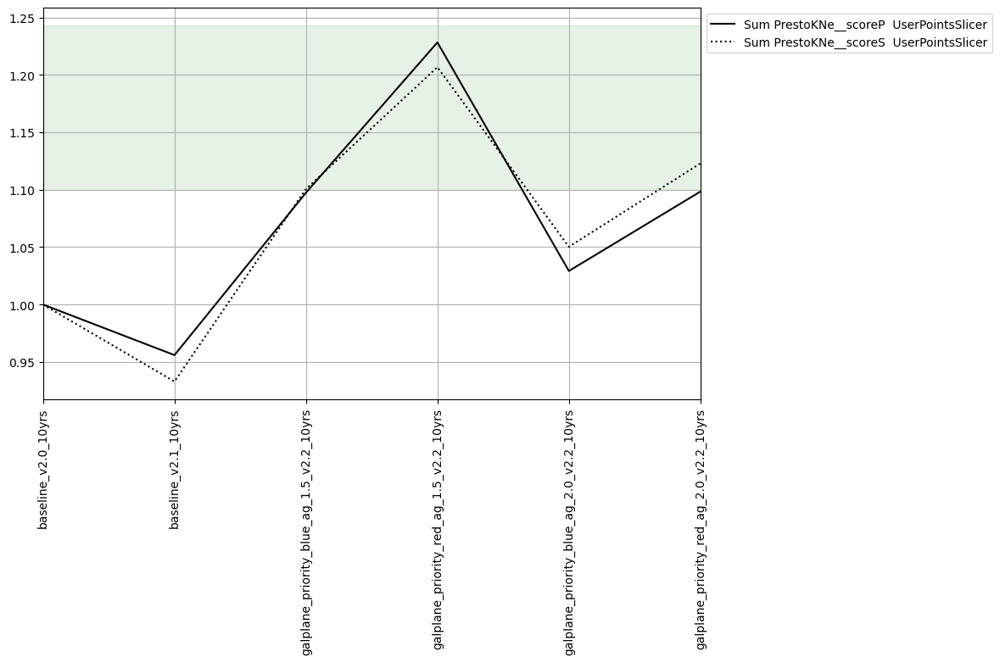

...

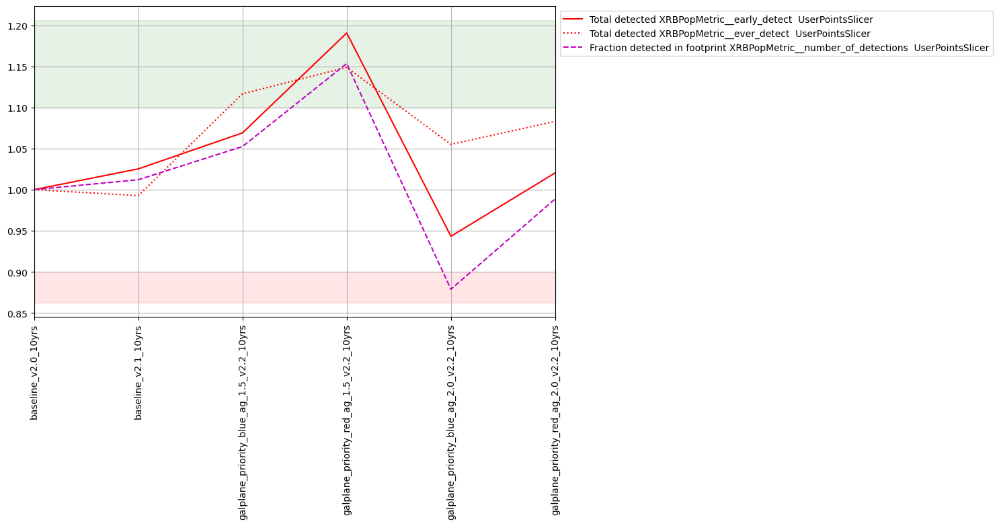

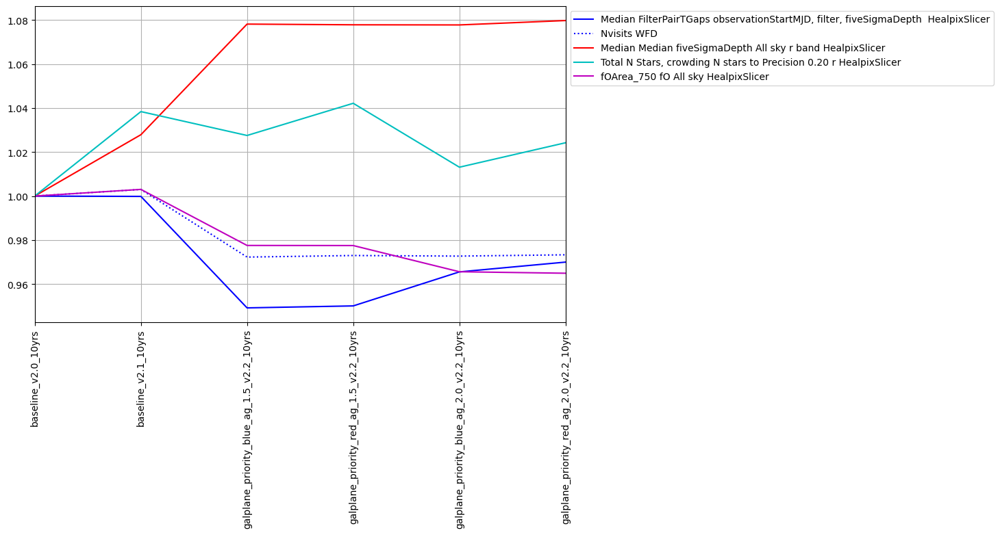

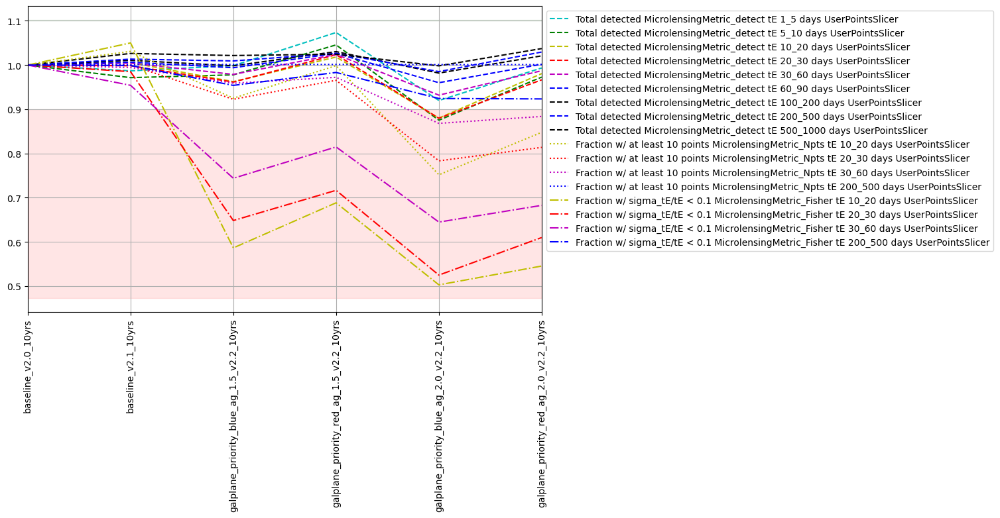

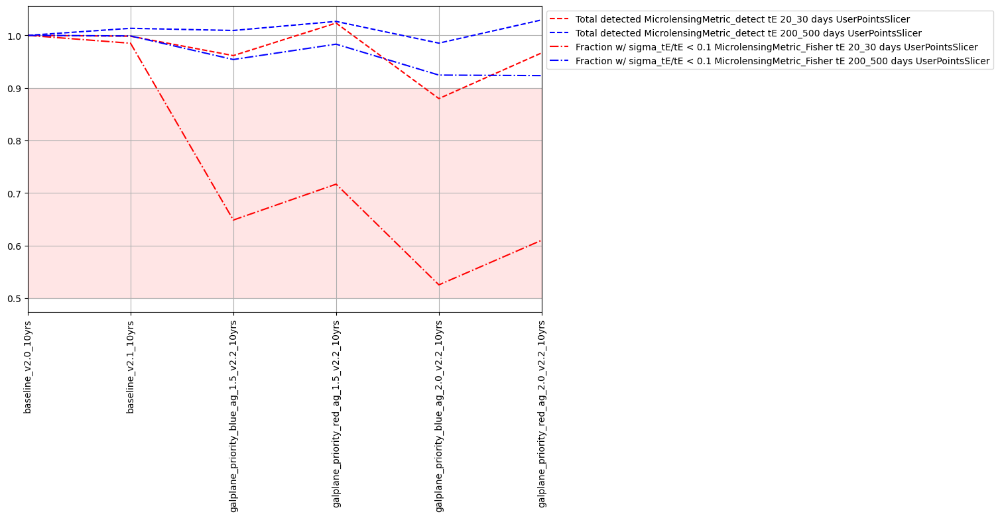

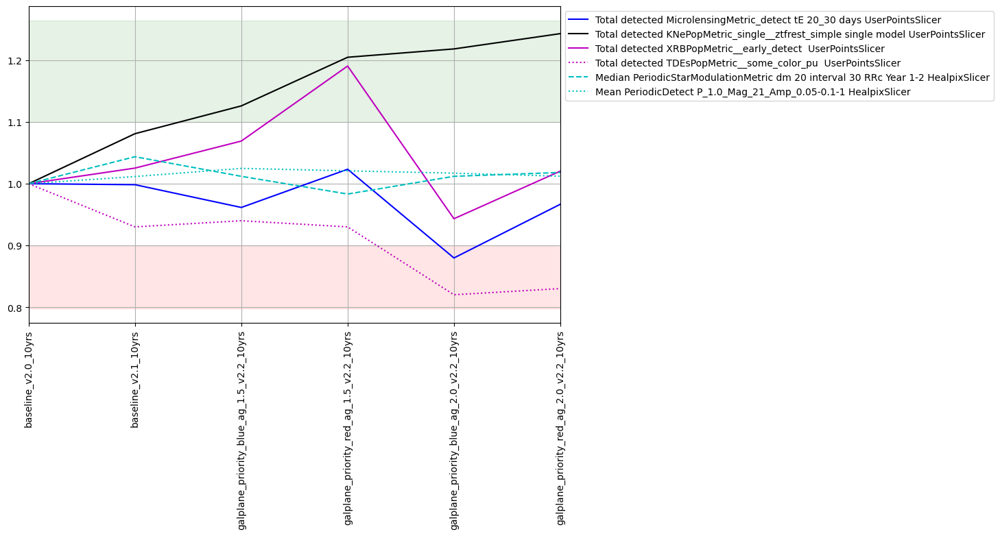

In [28]:
kk = [k for k in msets if k.startswith('TVS')]

for k in kk:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                                 baseline_run='baseline_v2.0_10yrs',
                                 metric_set=msub,
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=.1)

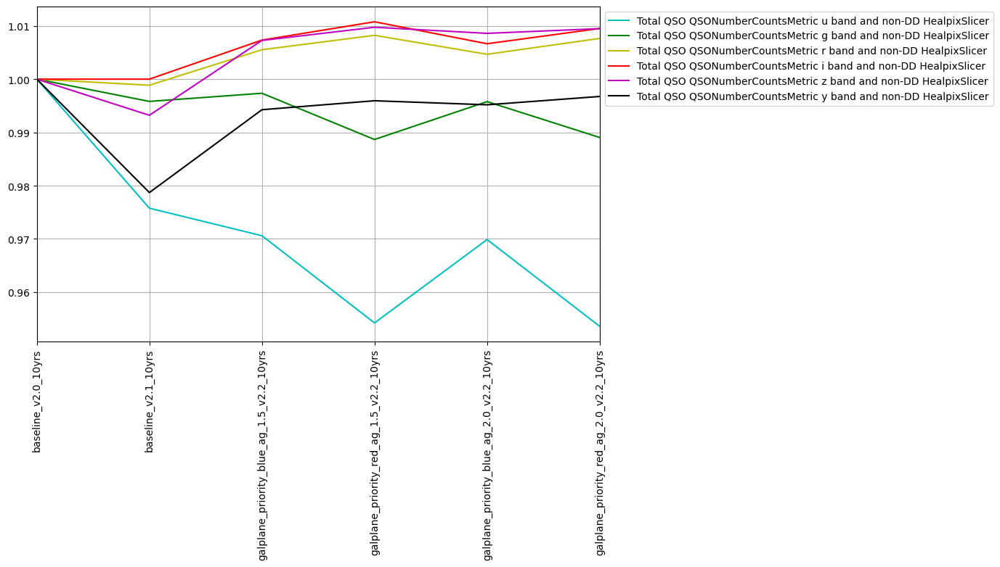

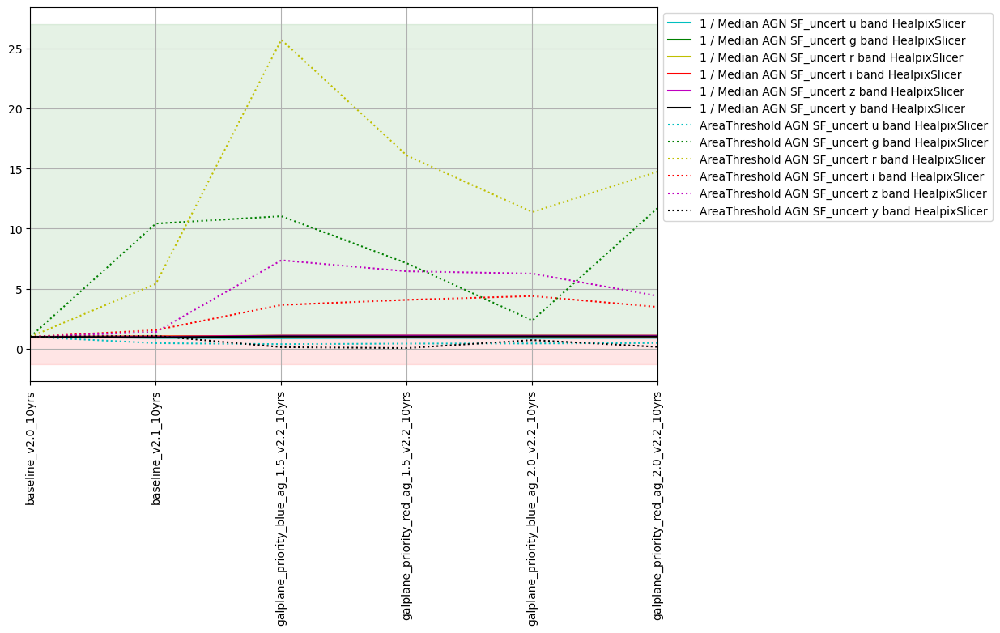

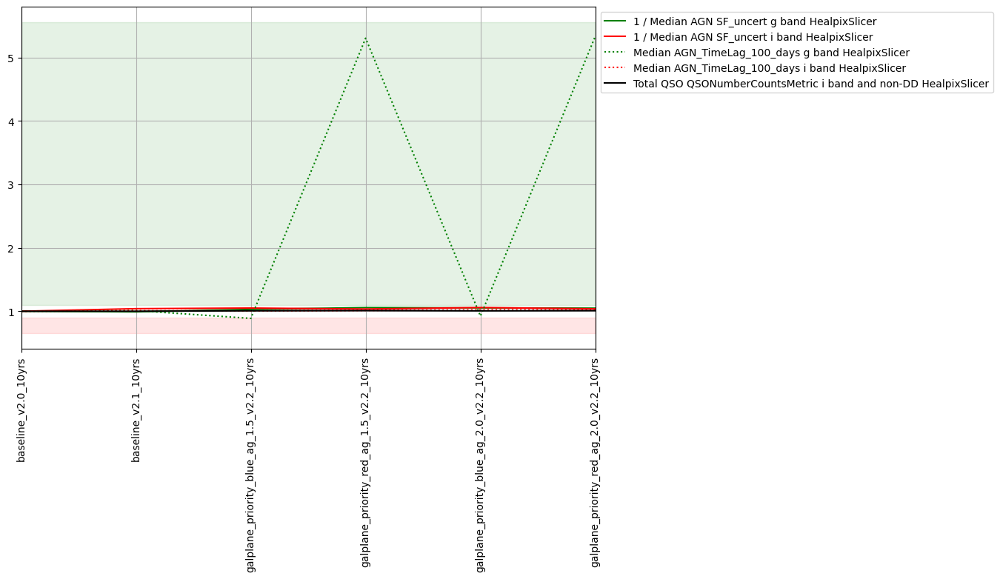

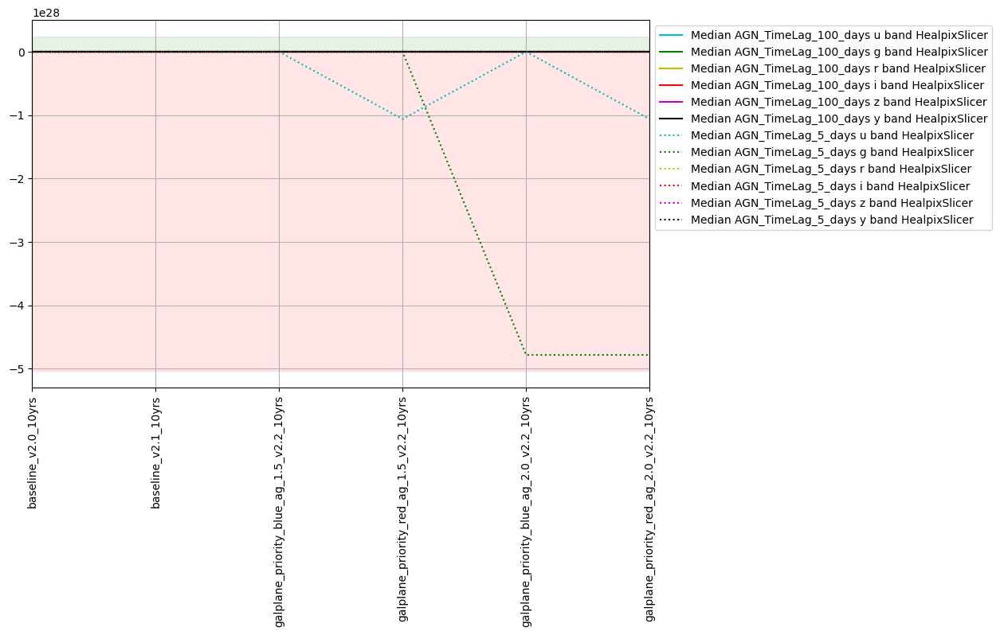

In [29]:
kk = [k for k in msets if k.startswith('AGN')]

for k in kk:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                                 baseline_run='baseline_v2.0_10yrs',
                                 metric_set=msub,
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=.1)

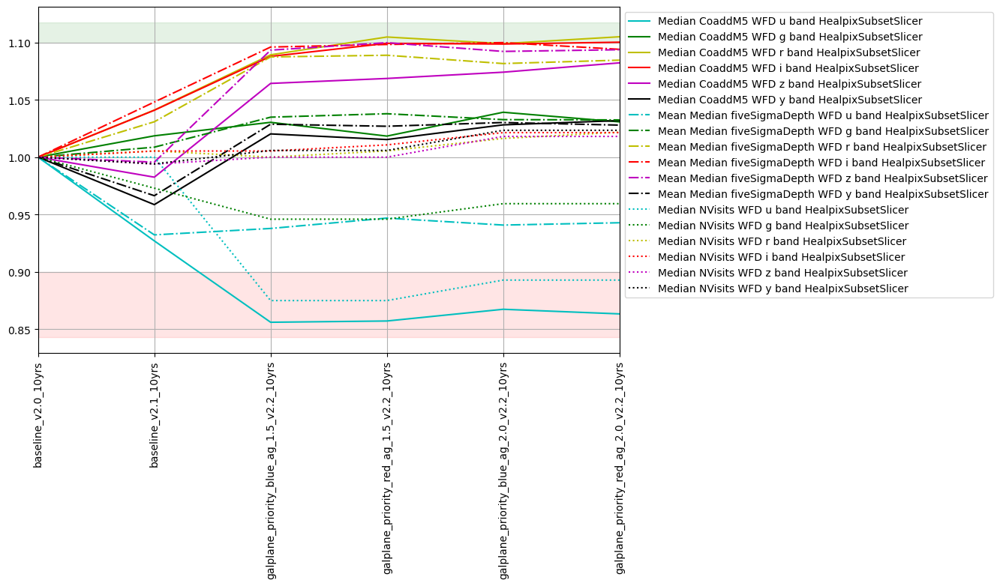

In [30]:
kk = [k for k in msets if k.startswith('WFD')]

for k in kk:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                                 baseline_run='baseline_v2.0_10yrs',
                                 metric_set=msub,
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=.1)

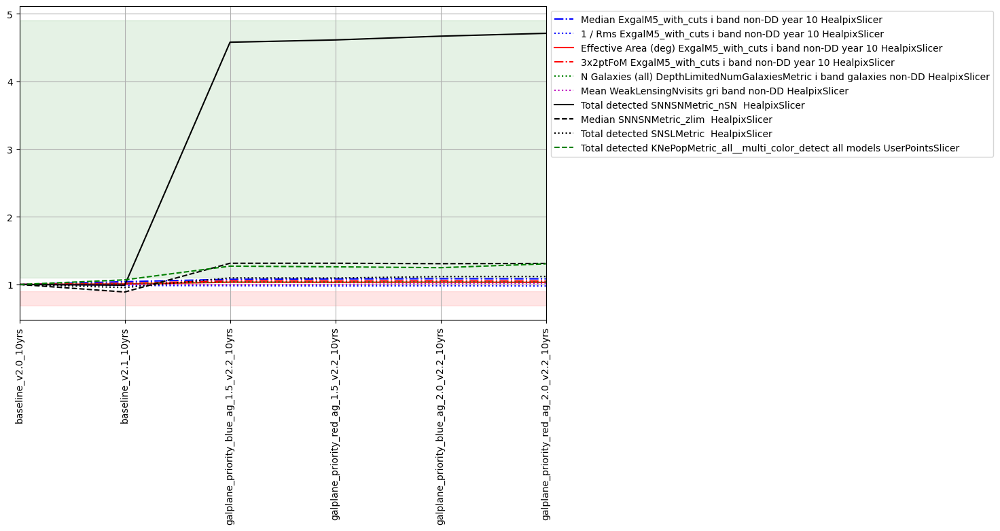

In [31]:
kk = [k for k in msets if k.startswith('DESC')]

for k in kk:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                                 baseline_run='baseline_v2.0_10yrs',
                                 metric_set=msub,
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=.1)

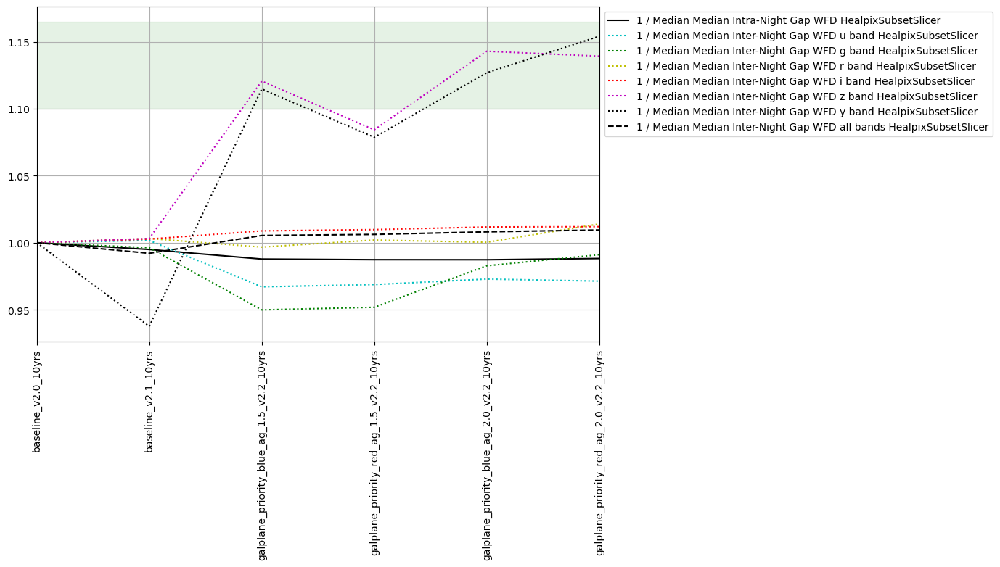

In [32]:
kk = [k for k in msets if k.startswith('cadence')]

for k in kk:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                                 baseline_run='baseline_v2.0_10yrs',
                                 metric_set=msub,
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=.1)

In [64]:
summaries['Nvisits All visits'].loc[these_runs]

baseline_v2.0_10yrs                         2086980.0
baseline_v2.1_10yrs                         2081749.0
galplane_priority_blue_ag_1.5_v2.2_10yrs    2074498.0
galplane_priority_red_ag_1.5_v2.2_10yrs     2074651.0
galplane_priority_blue_ag_2.0_v2.2_10yrs    2075910.0
galplane_priority_red_ag_2.0_v2.2_10yrs     2075780.0
Name: Nvisits All visits, dtype: float64